In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn import preprocessing
import pandas as pd
%matplotlib inline

In [8]:
header = ['loc', 'age', 'Income-level', ' car-cost', 'park&ride-cost', 'metro-cost', 'bus-cost', 'car-traveltime', 'park&ride-traveltime', 'metro-traveltime', 'bus-traveltime', 'decision']

df = pd.read_csv('project1.csv', names=header)
df.head(20)

,loc,age,Income-level,car-cost,park&ride-cost,metro-cost,bus-cost,car-traveltime,park&ride-traveltime,metro-traveltime,bus-traveltime,decision
0,11,34,1,25,12,3,1,15,25,30,30,bus
1,11,52,2,25,12,3,1,15,25,30,30,metro
2,11,50,3,45,12,4,2,15,25,40,30,park and ride
3,11,44,1,35,16,5,3,25,35,50,40,bus
4,11,61,1,45,18,5,3,35,45,60,50,bus
5,11,44,1,25,12,3,1,15,25,40,30,bus
6,11,27,1,25,16,5,3,15,35,60,40,bus
7,11,54,2,25,16,5,3,15,35,60,40,park and ride
8,11,43,3,35,12,4,2,15,25,40,30,car
9,11,61,1,45,16,5,3,25,35,60,40,metro


In [11]:
df.columns

Index(['loc', 'age', 'Income-level', ' car-cost', 'park&ride-cost',
       'metro-cost', 'bus-cost', 'car-traveltime', 'park&ride-traveltime',
       'metro-traveltime', 'bus-traveltime', 'decision'],
      dtype='object')

In [15]:
x = df[['loc', 'age', 'Income-level', ' car-cost', 'park&ride-cost',
       'metro-cost', 'bus-cost', 'car-traveltime', 'park&ride-traveltime',
       'metro-traveltime', 'bus-traveltime']].values


y = df['decision'].values

In [16]:
# normalize data
scaler = preprocessing.StandardScaler().fit(x)
x = scaler.transform(x.astype(float))
print(x[:6])


[[-1.41777996 -1.06145253 -1.23942334 -0.6574997  -0.92684402 -1.73205081
  -1.73205081 -0.85610254 -0.86581197 -1.52705788 -0.86581197]
 [-1.41777996  0.30132533  0.06523281 -0.6574997  -0.92684402 -1.73205081
  -1.73205081 -0.85610254 -0.86581197 -1.52705788 -0.86581197]
 [-1.41777996  0.14990556  1.36988895  1.42980092 -0.92684402 -0.44905021
  -0.44905021 -0.85610254 -0.86581197 -0.60156826 -0.86581197]
 [-1.41777996 -0.30435372 -1.23942334  0.38615061  0.35156152  0.83395039
   0.83395039  0.31664067  0.24420337  0.32392137  0.24420337]
 [-1.41777996  0.98271426 -1.23942334  1.42980092  0.9907643   0.83395039
   0.83395039  1.48938388  1.35421872  1.249411    1.35421872]
 [-1.41777996 -0.30435372 -1.23942334 -0.6574997  -0.92684402 -1.73205081
  -1.73205081 -0.85610254 -0.86581197 -0.60156826 -0.86581197]]


In [17]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=4)
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(80, 11) (80,)
(20, 11) (20,)


# Training


In [64]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=200, max_depth=100)
rf.fit(x_train, y_train)

RandomForestClassifier(max_depth=100, n_estimators=200)

In [65]:
yhat = rf.predict(x_test)
print(yhat[:5])
print(y[:5])

['park and ride' 'bus' 'car' 'bus' 'park and ride']
['bus' 'metro' 'park and ride' 'bus' 'bus']


# Accuracy evaluation

In [66]:
from sklearn import metrics
print('Train set Accuracy: ', metrics.accuracy_score(y_train, rf.predict(x_train)))
print('Test set Accuracy: ', metrics.accuracy_score(y_test, yhat))


Train set Accuracy:  0.9875
Test set Accuracy:  0.6


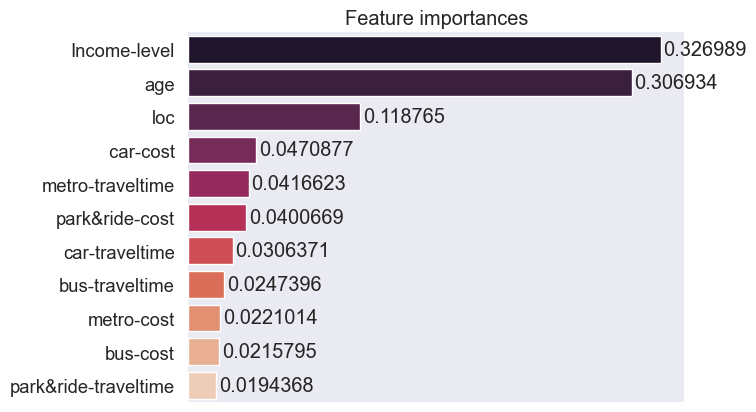

In [93]:
from sklearn.feature_selection import SelectFromModel
f =('loc', 'age', 'Income-level', ' car-cost', 'park&ride-cost',
       'metro-cost', 'bus-cost', 'car-traveltime', 'park&ride-traveltime',
       'metro-traveltime', 'bus-traveltime')
features_df = pd.DataFrame({'features': f , 'importances': rf.feature_importances_ })


features_df_sorted = features_df.sort_values(by='importances', ascending=False)

g = sns.barplot(data=features_df_sorted, x='importances', y ='features', palette="rocket")
sns.despine(bottom = True, left = True)
g.set_title('Feature importances')
g.set(xlabel=None)
g.set(ylabel=None)
g.set(xticks=[])
for value in g.containers:
    g.bar_label(value, padding=2)

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1437641607)


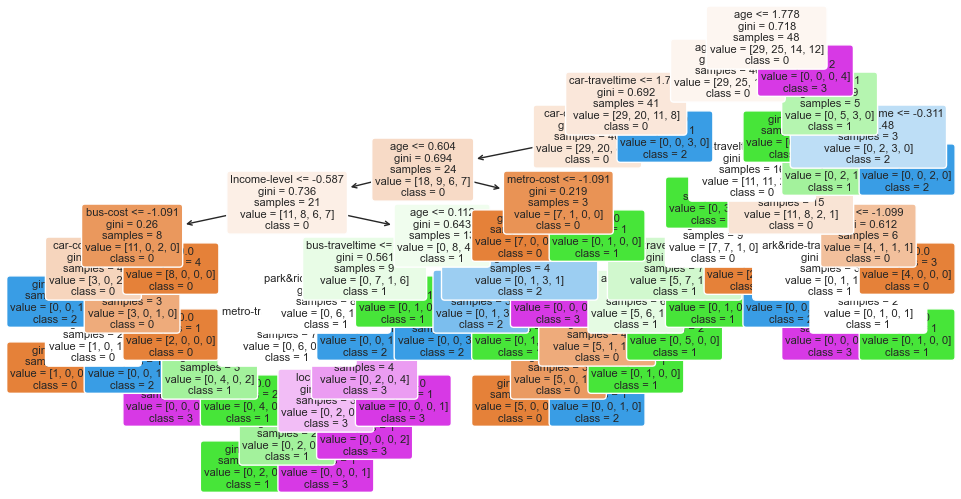

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=2022245900)


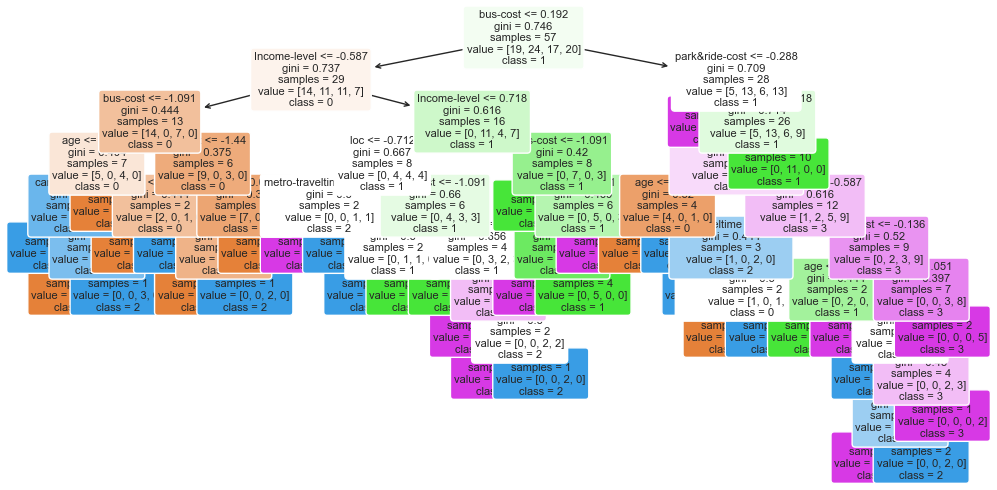

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=446808612)


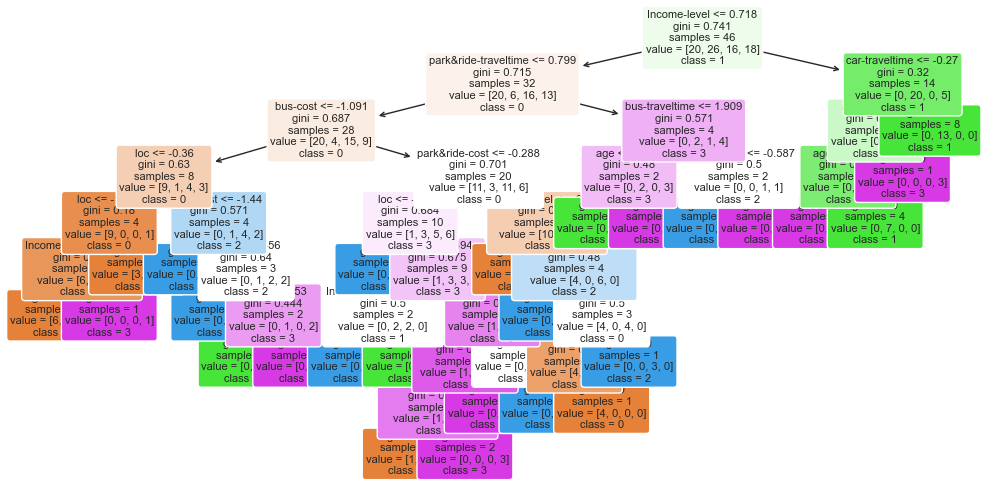

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=634399769)


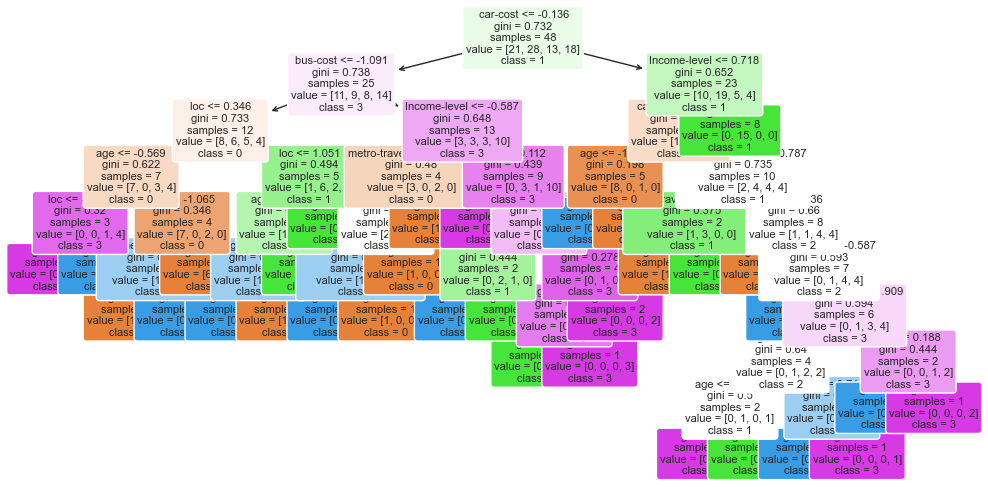

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1183769855)


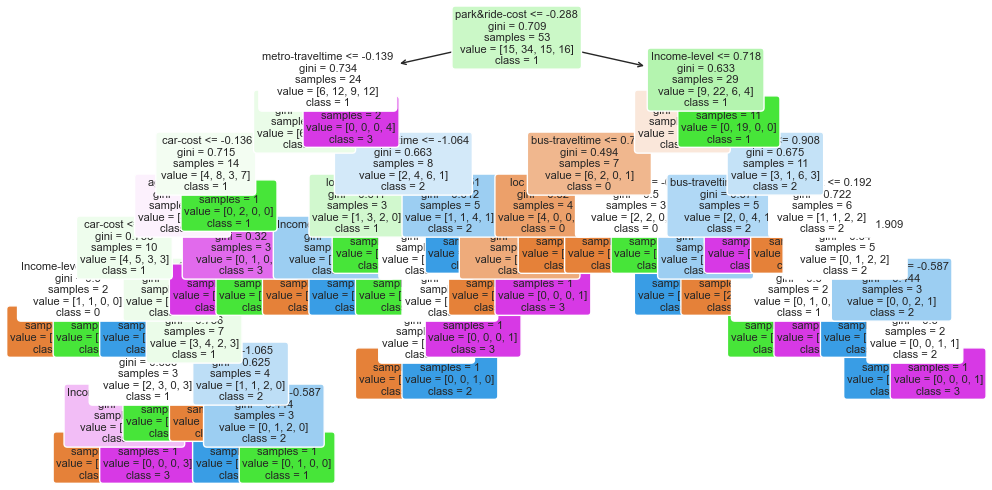

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1413920578)


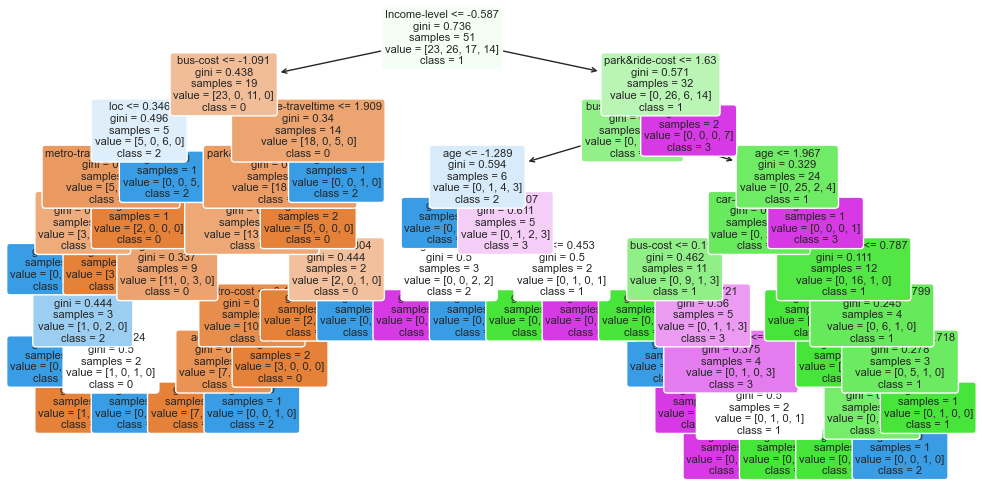

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1793912090)


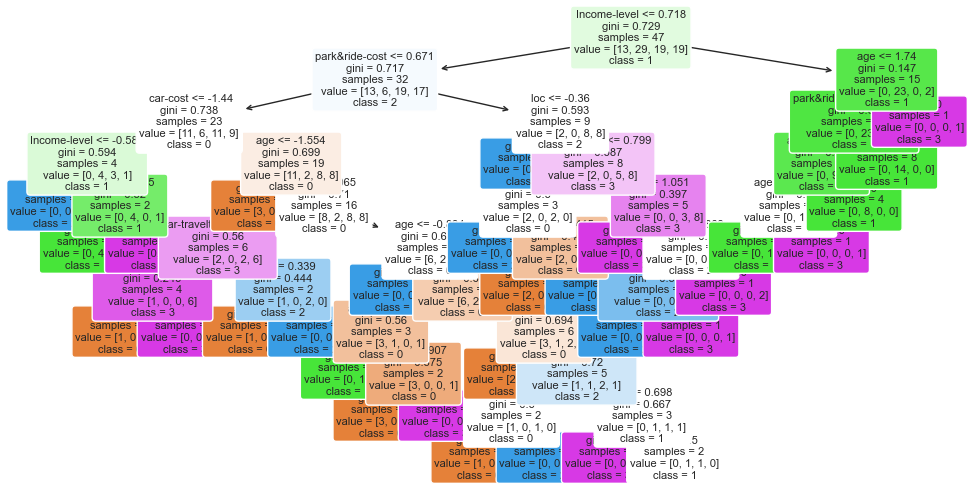

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1636288948)


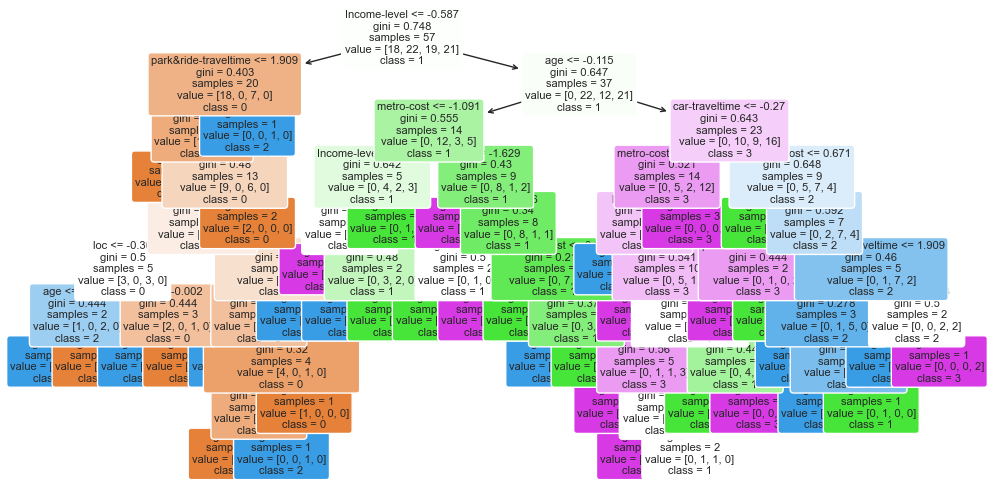

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=876633039)


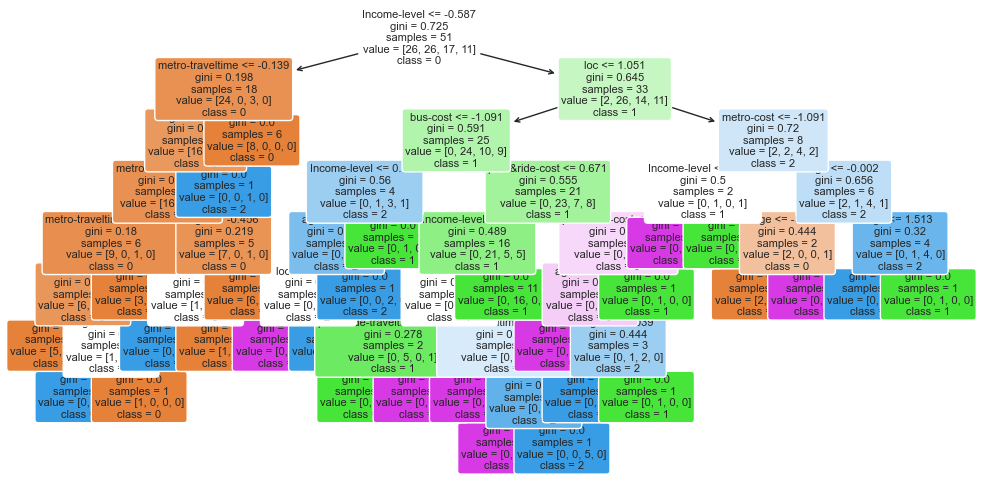

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=2033693625)


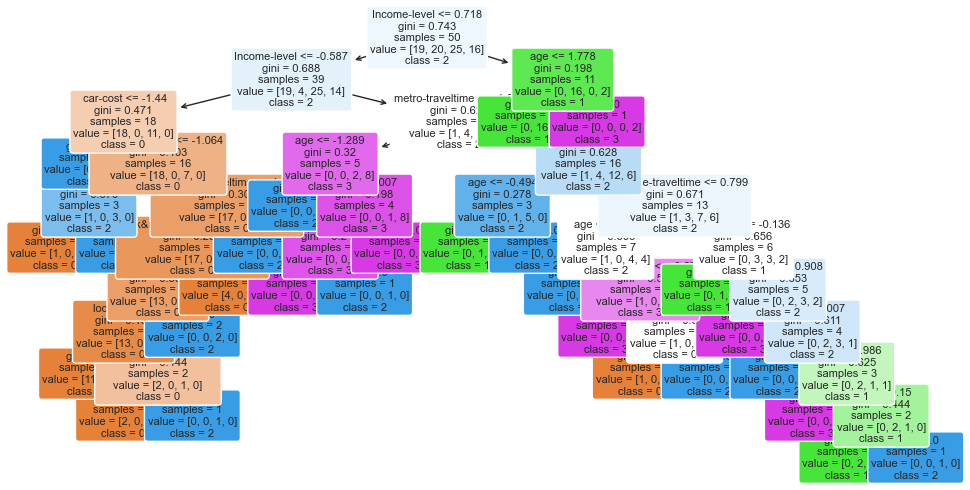

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=454366604)


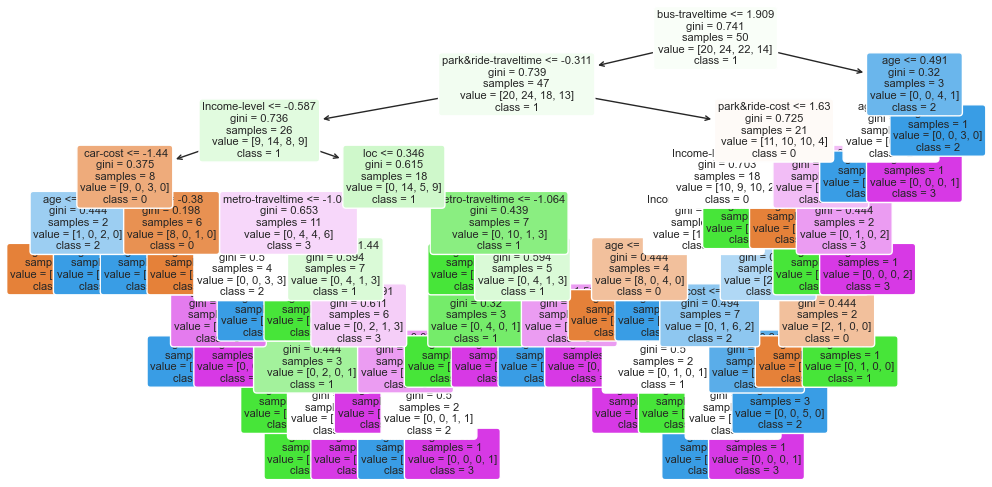

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=29111302)


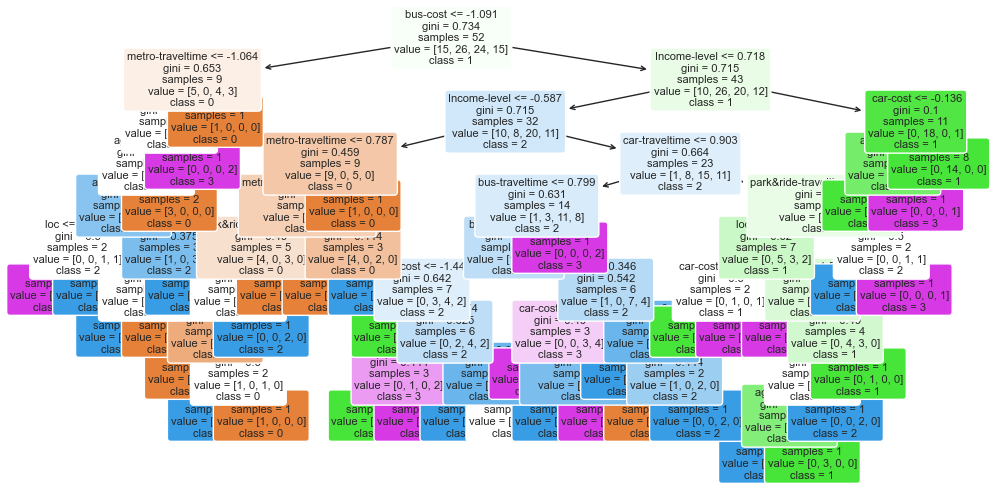

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=48912832)


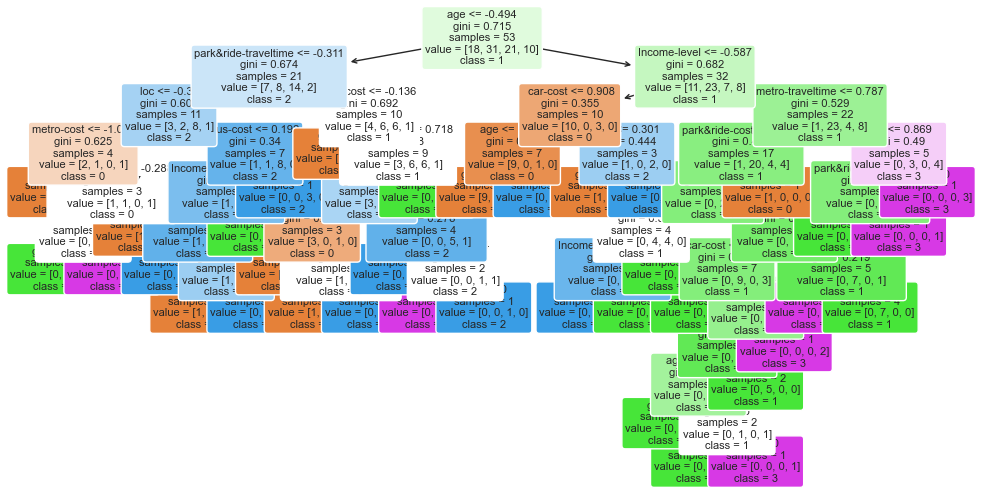

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1574604149)


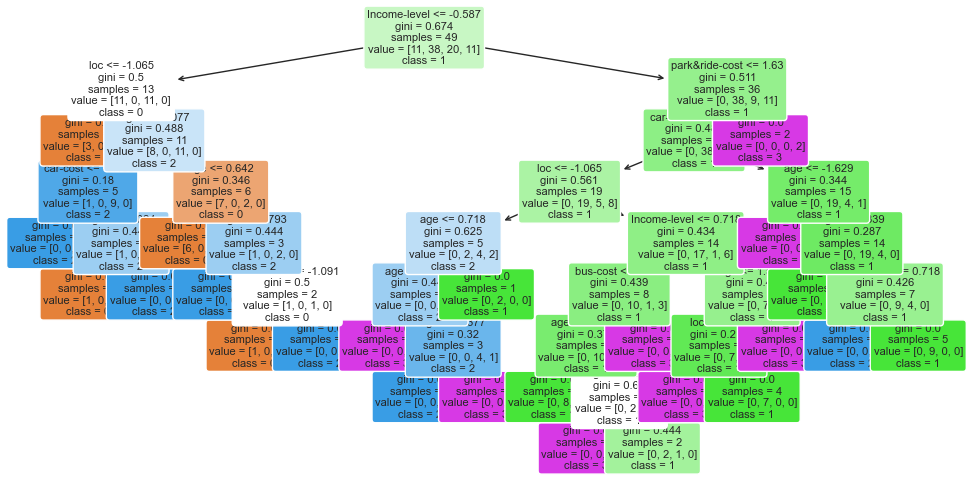

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=245290555)


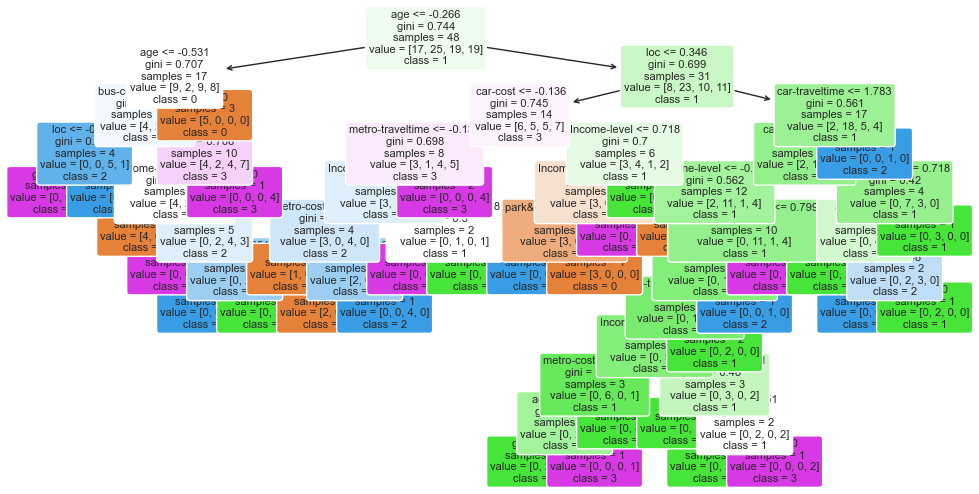

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=614112895)


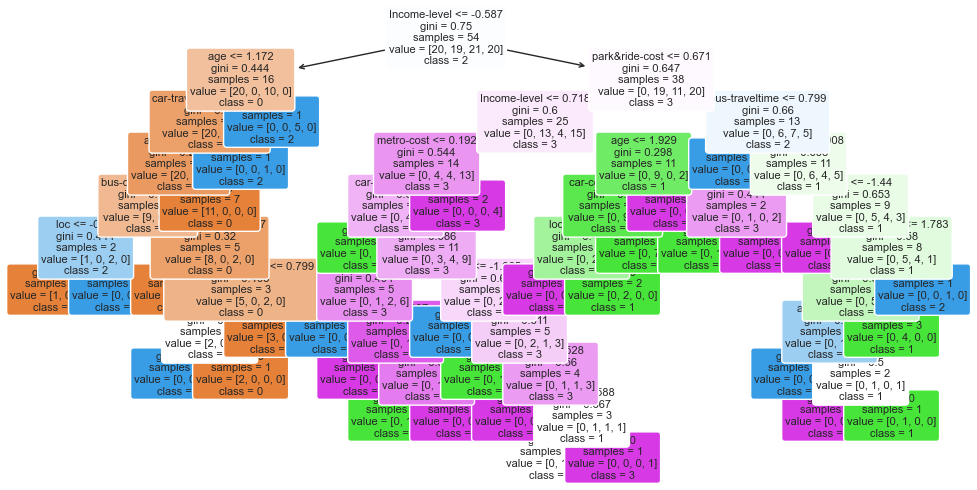

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=674765752)


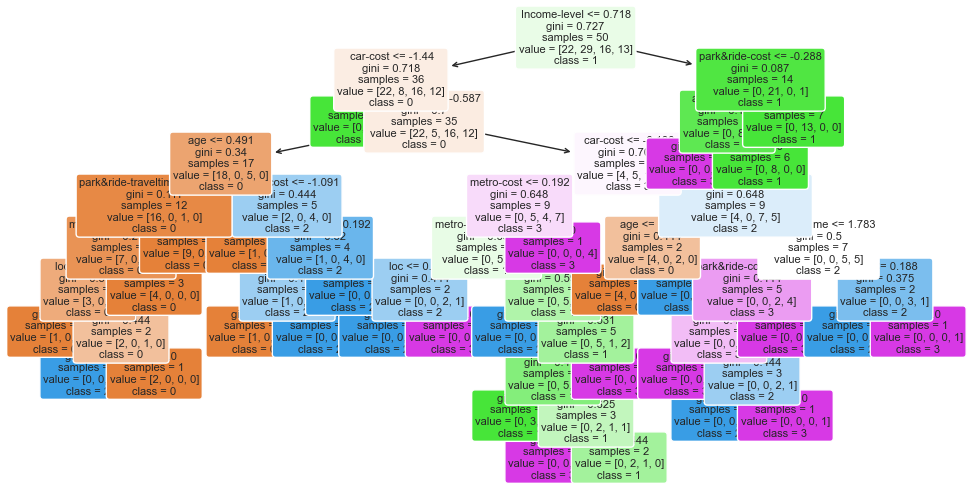

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1193462231)


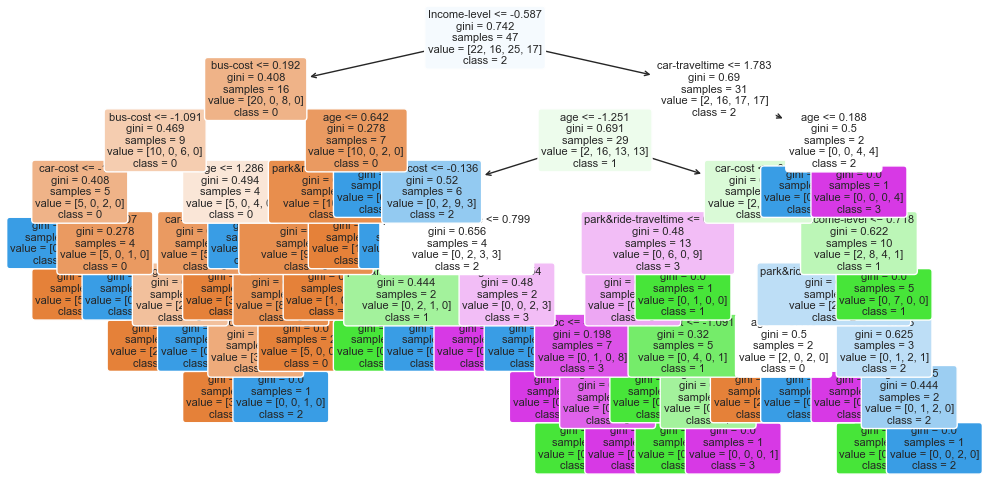

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1899975789)


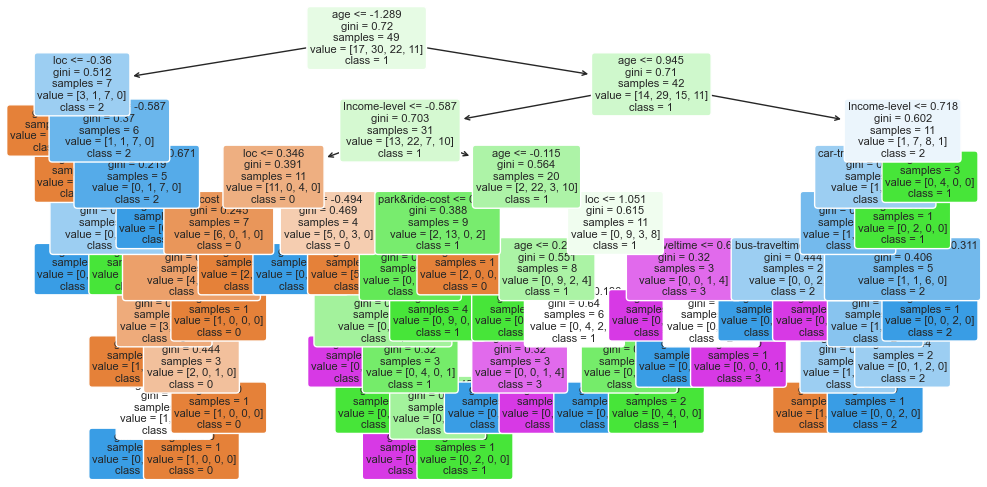

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=856290970)


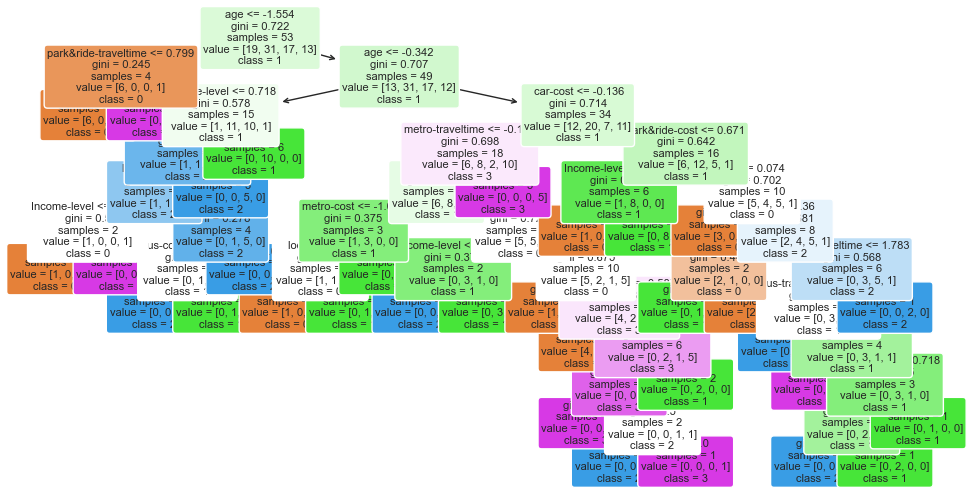

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1772475169)


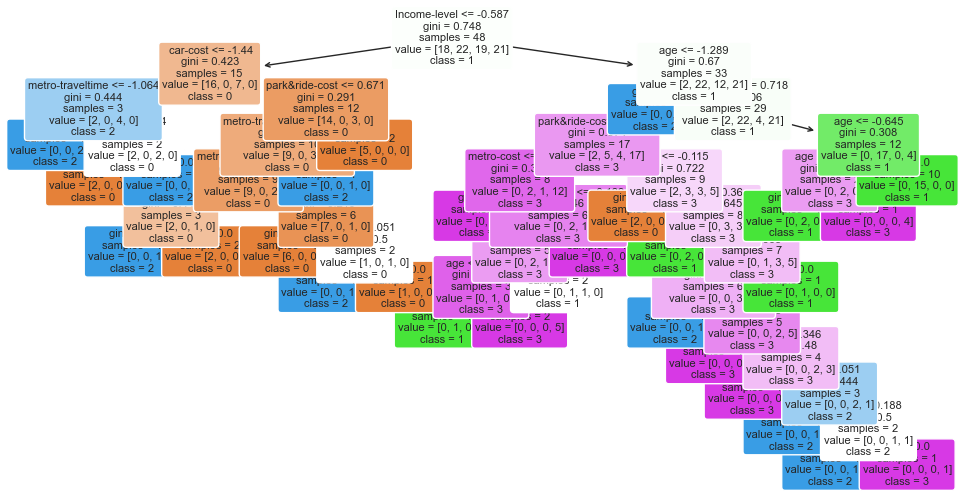

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=220371489)


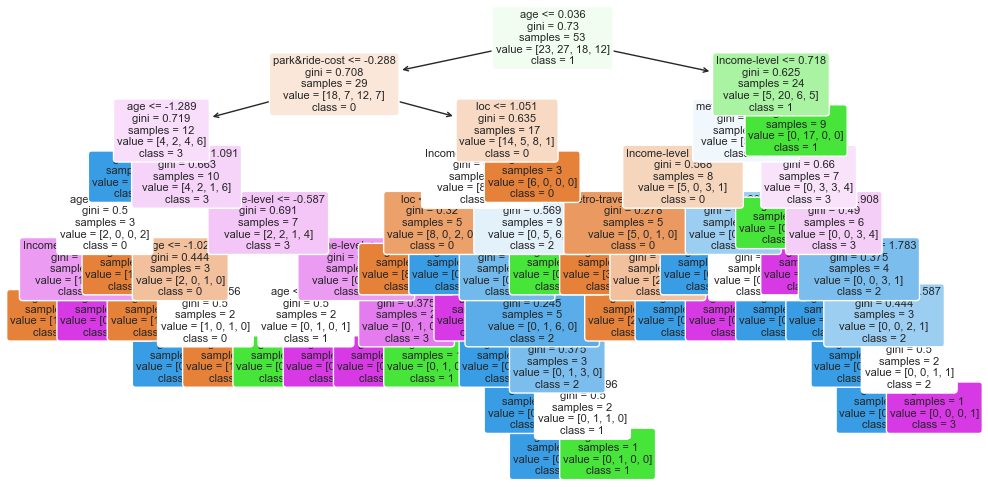

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1686403904)


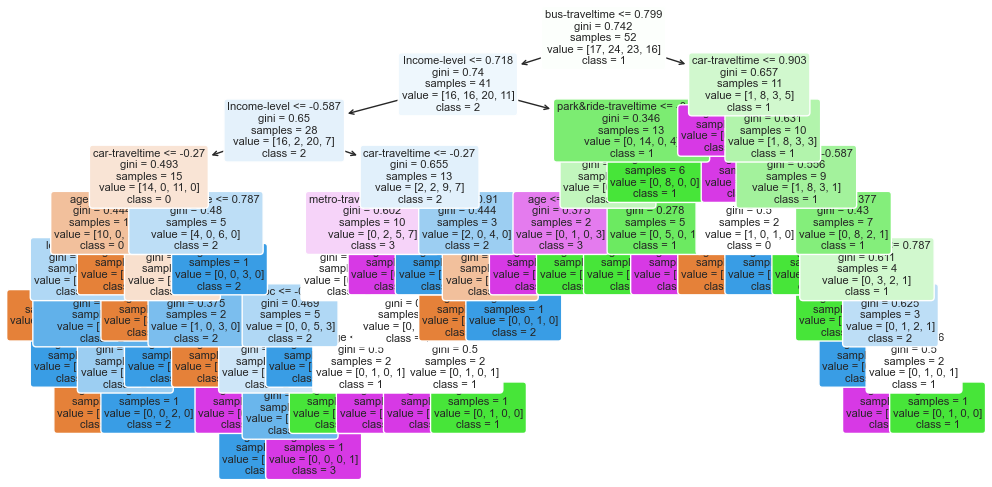

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=334394133)


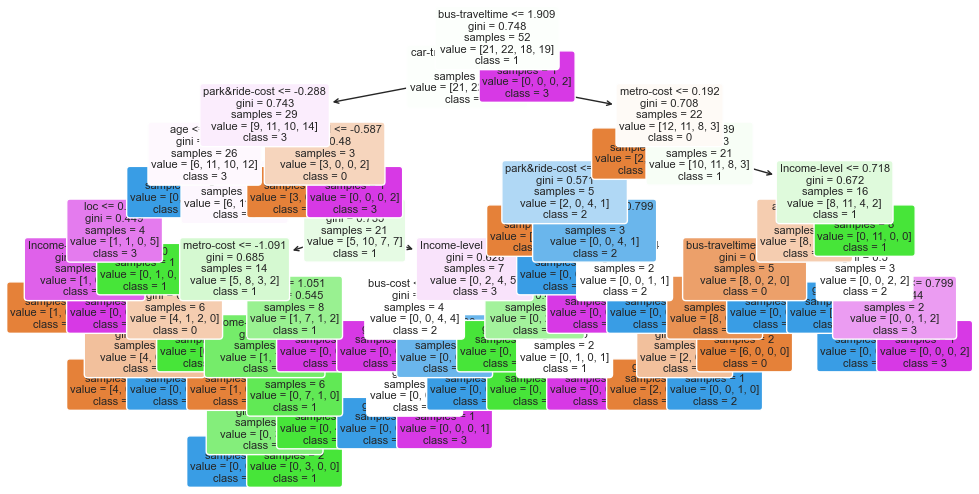

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=407645428)


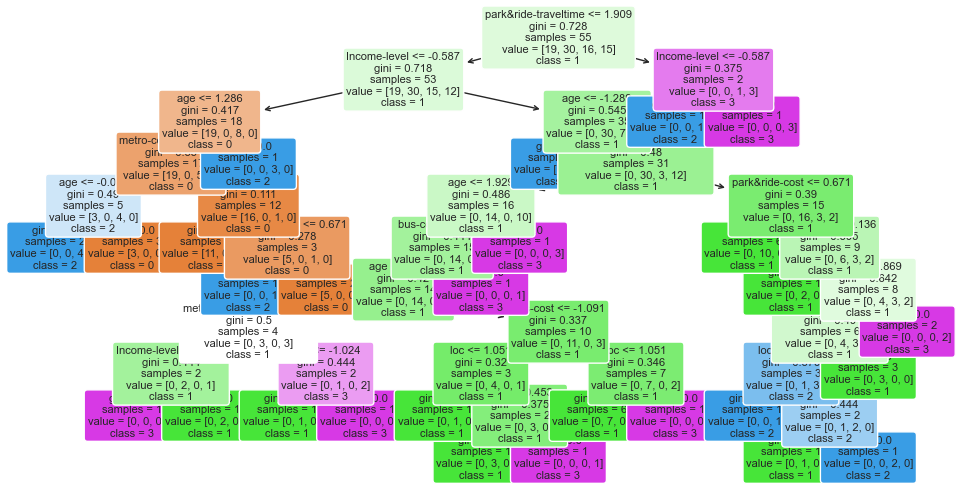

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=625880559)


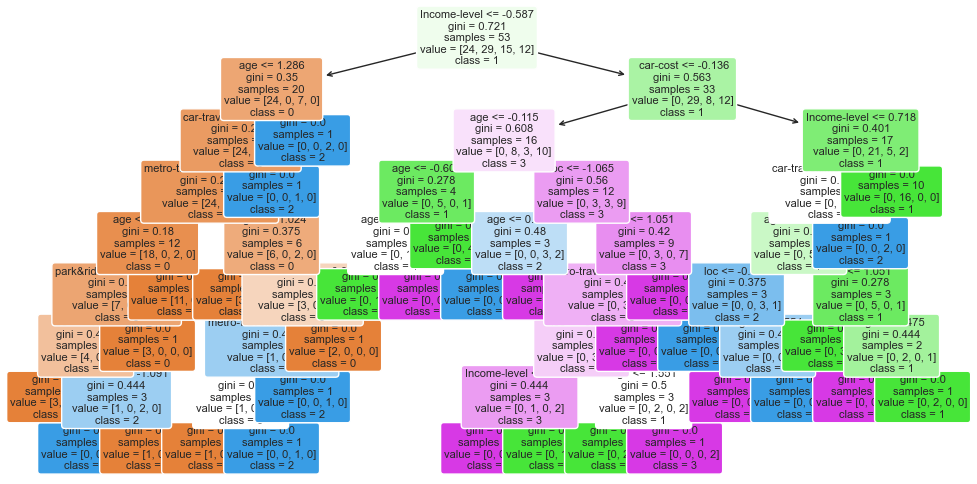

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=800006714)


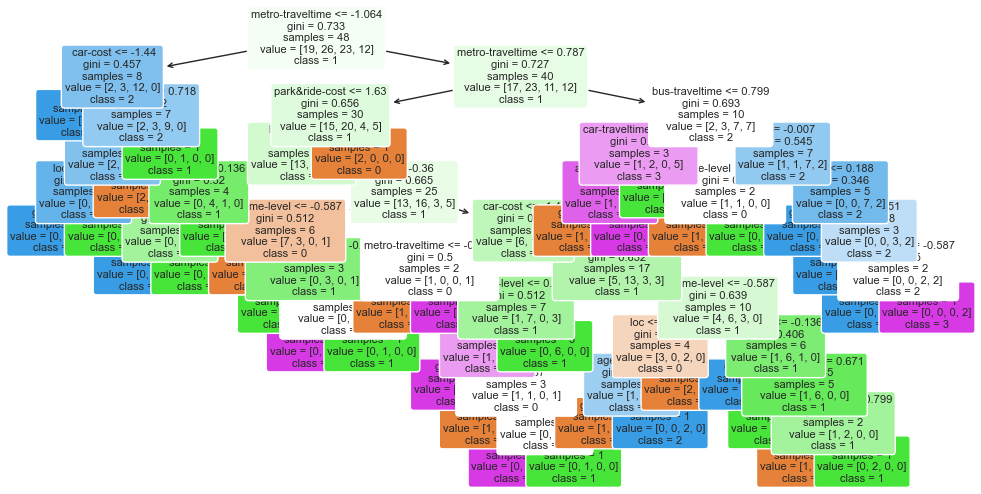

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=939220877)


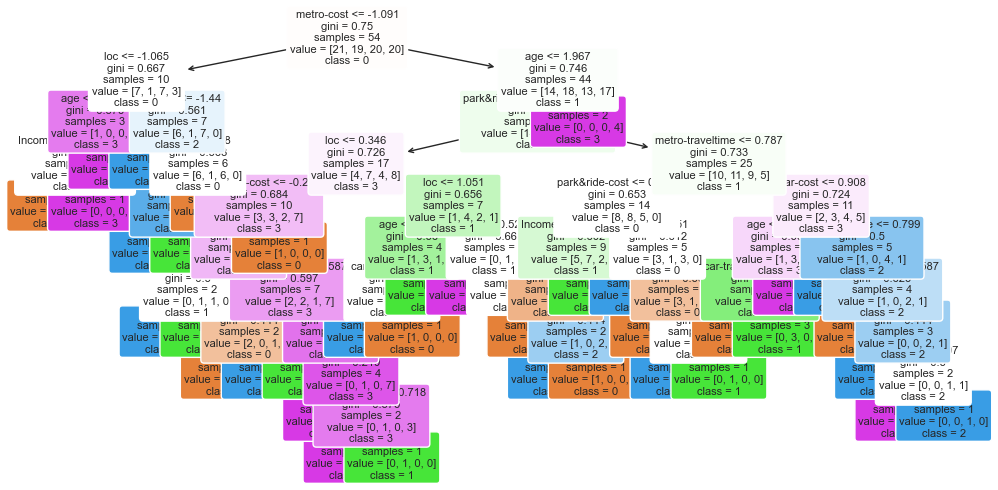

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=310680140)


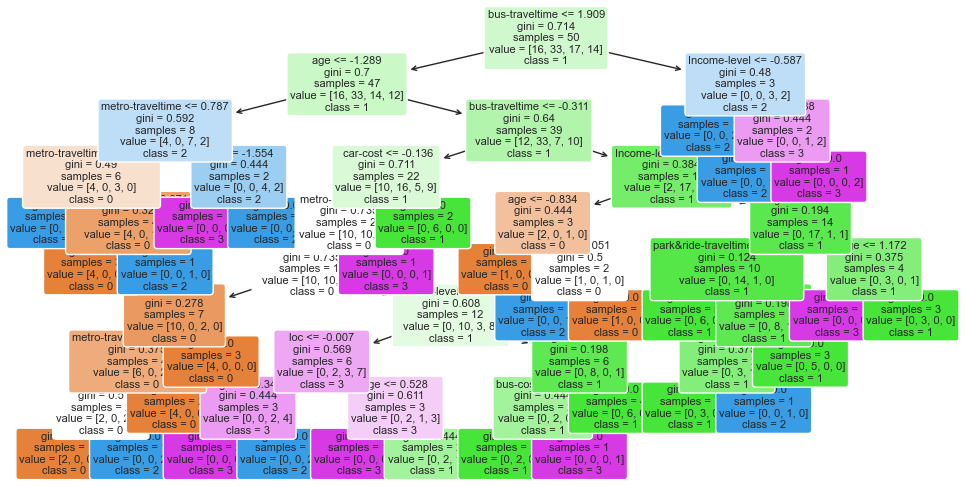

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1857393229)


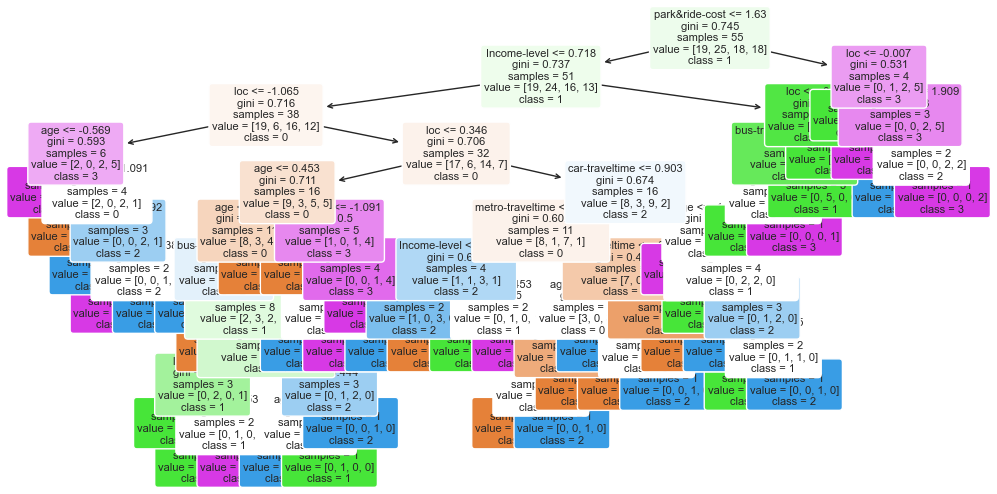

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1378143904)


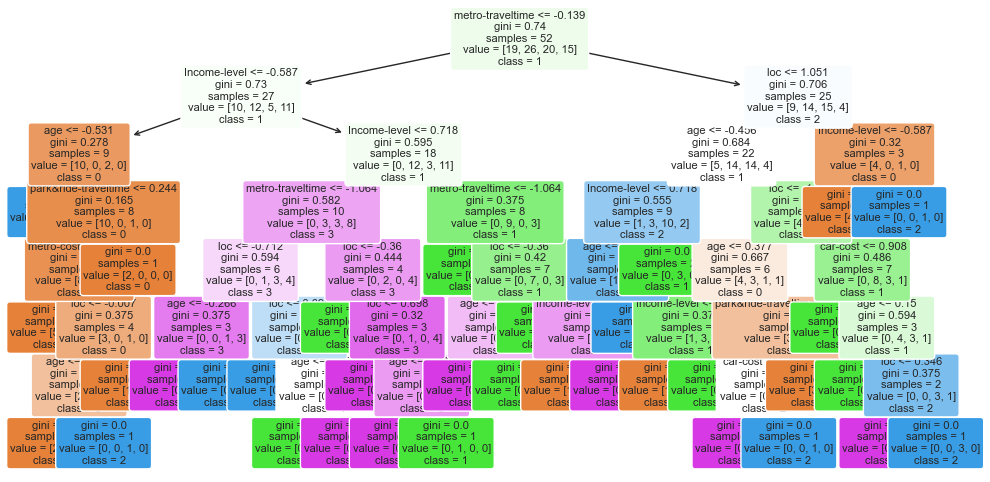

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=693176221)


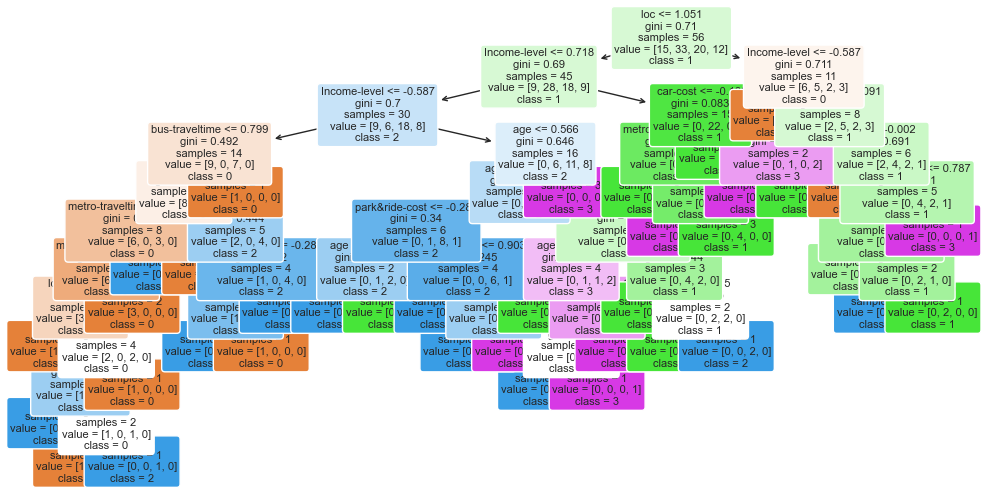

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=992123013)


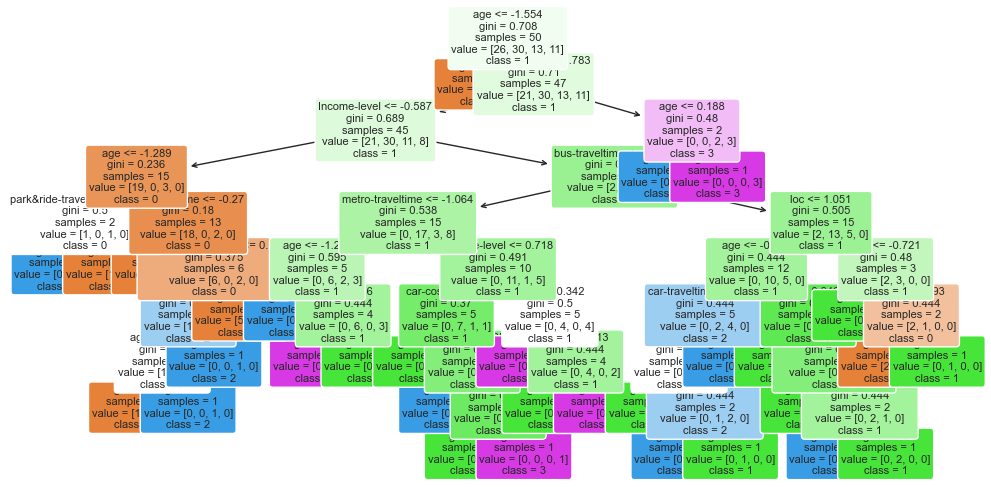

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1345030387)


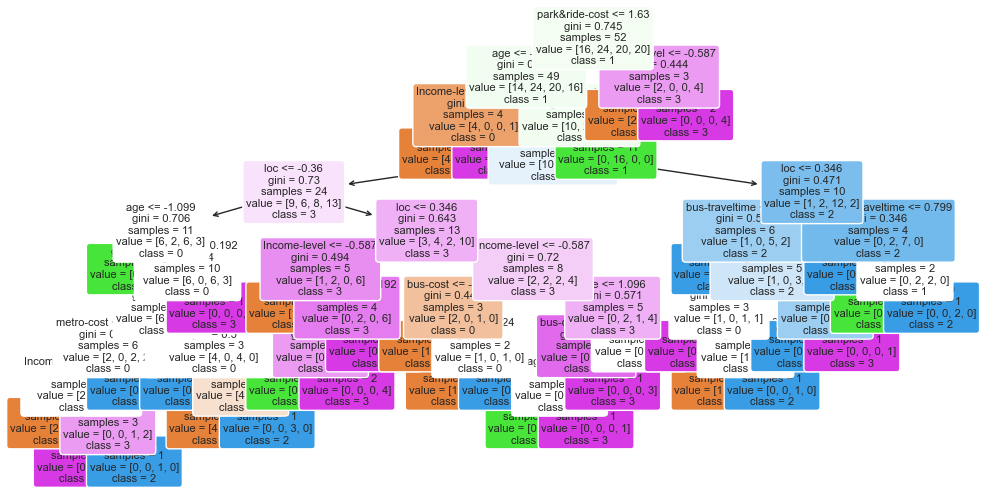

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=443140270)


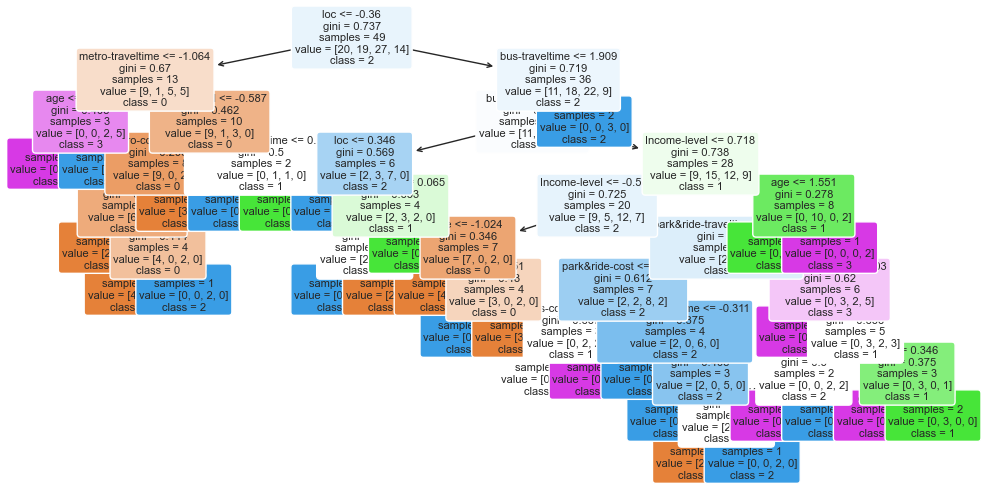

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=2089056273)


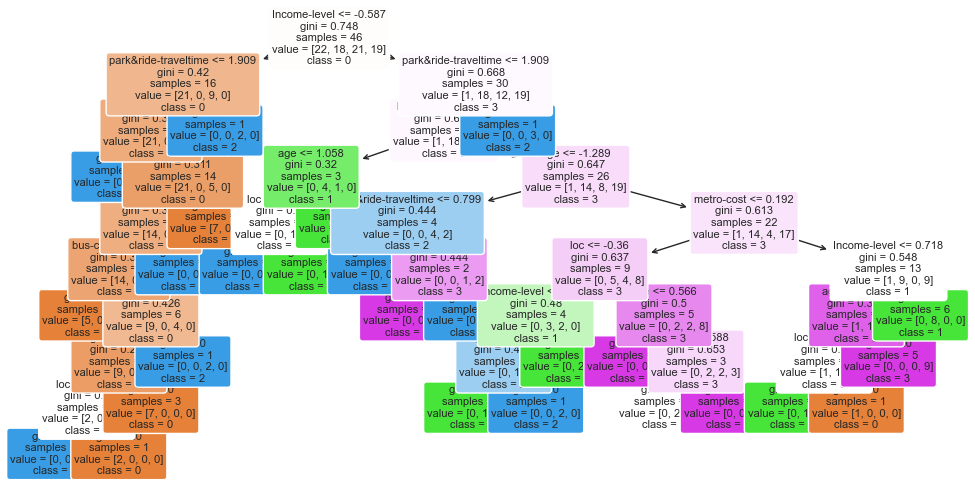

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=127328716)


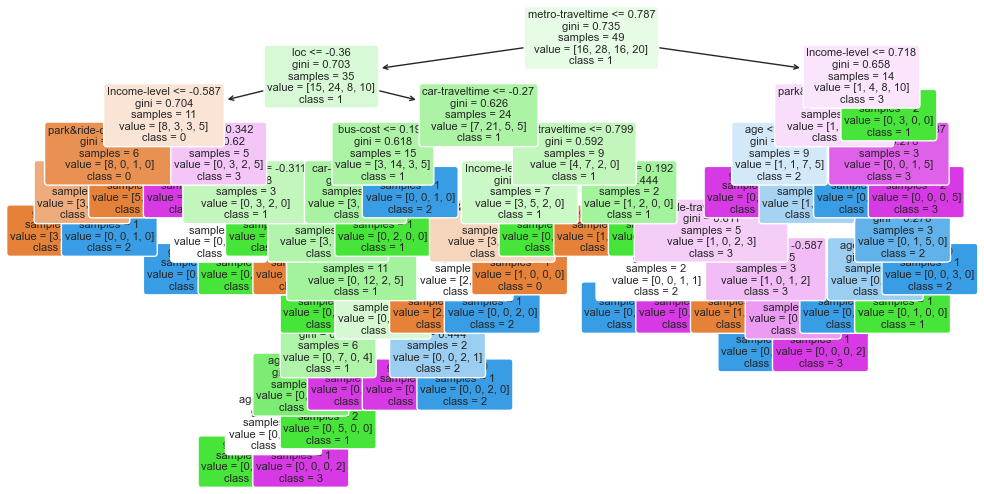

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=847423800)


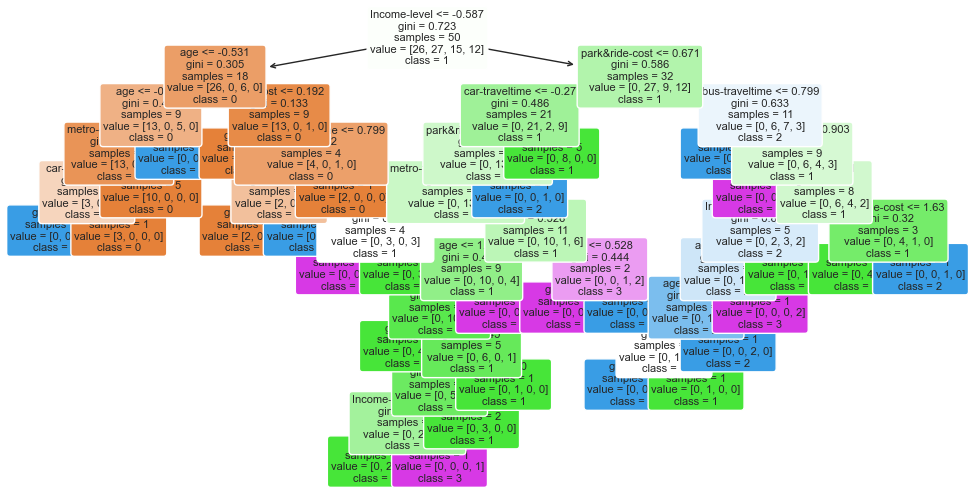

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=829001602)


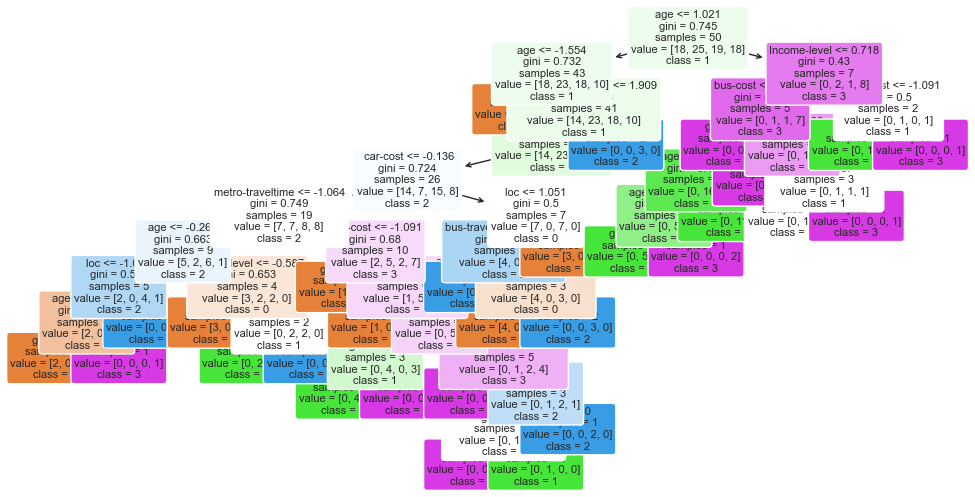

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1020966780)


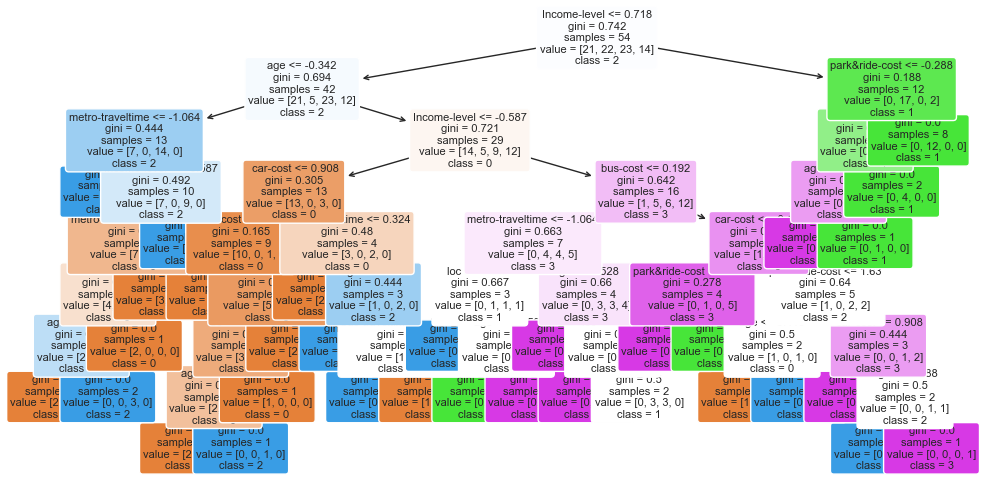

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1713756163)


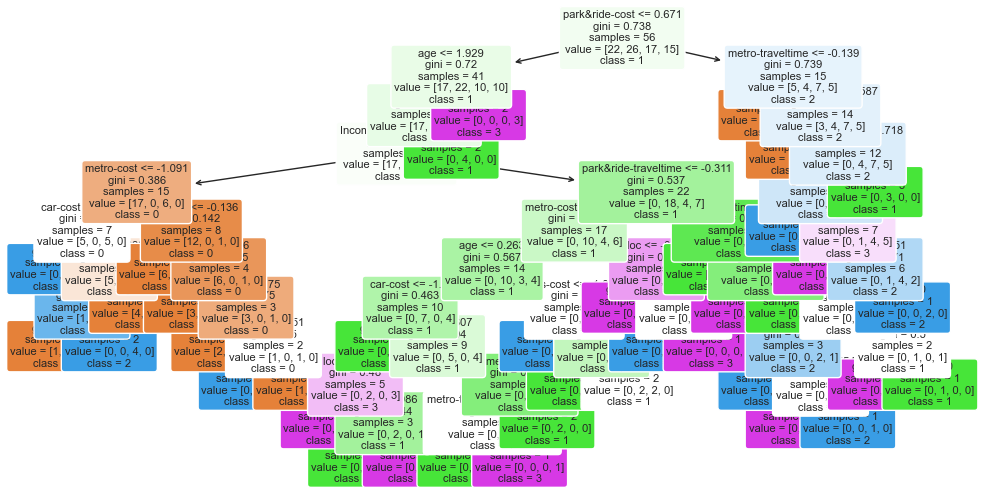

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1513973609)


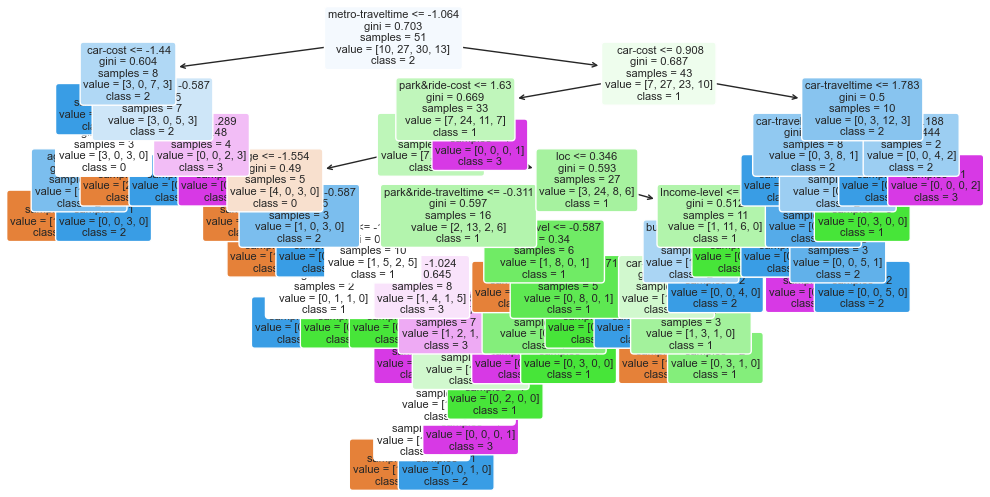

DecisionTreeClassifier(max_depth=100, max_features='sqrt',
                       random_state=1708187975)


KeyboardInterrupt: 

In [68]:
from sklearn import tree

features = df.columns.values 
classes = ['0', '1', '2','3'] 


for estimator in rf.estimators_:
    print(estimator)
    plt.figure(figsize=(12,6))
    tree.plot_tree(estimator,
                   feature_names=features,
                   class_names=classes,
                   fontsize=8, 
                   filled=True, 
                   rounded=True)
    plt.show()